# calculer les mots les plus utilisés

In [1]:
import nltk
from nltk.corpus import stopwords
from collections import Counter
# nltk.download('punkt')
# nltk.download('stopwords')
from tqdm.notebook import tqdm
import re
import csv
from nltk.util import ngrams

In [175]:
PATH = "C:/Users/Minhee KYOUNG/Desktop/.ipynb_checkpoints/"
titles = list()
with open(PATH + 'csv-covid-19-set.csv', encoding = 'utf-8-sig') as file :
    lines = csv.reader(file, delimiter = ',')
    for line in lines:
        titles.append(line[1])

titles[0:10]

['Title',
 'From SARS to COVID-19: What we have learned about children infected with COVID-19',
 'COVID-19 diagnosis and management: a comprehensive review',
 'COVID-19, Virology and Geroscience: A Perspective',
 'Current Status of Epidemiology, Diagnosis, Therapeutics, and Vaccines for Novel Coronavirus Disease 2019 (COVID-19)',
 'A comprehensive review of COVID-19 characteristics',
 'COVID-19 (Novel Coronavirus 2019) - recent trends',
 'Perspectives on monoclonal antibody therapy as potential therapeutic intervention for Coronavirus disease-19 (COVID-19)',
 'SARS-CoV-2 and the COVID-19 disease: a mini review on diagnostic methods',
 'Coronavirus disease 2019 (COVID-19): current status and future perspectives']

In [209]:
import nltk
from nltk.corpus import stopwords
from collections import Counter
# nltk.download('punkt')
# nltk.download('stopwords')
from tqdm.notebook import tqdm
import re

stopwords.words('english').append('2')
stops = set(stopwords.words('english'))

result = []
for title in tqdm(titles[1:]):
    cleaned = re.sub('[-=+,#/\?:^$.@*\"※~&%ㆍ!』\\‘|\(\)\[\]\<\>`\'…》]', '', title)
    cleaned2 = cleaned.lower()
    token = nltk.word_tokenize(str(cleaned2))
    
    for w in token:
        if w not in stops:
            result.append(w)

frequencies = Counter(result)

# word cloud - stopwords

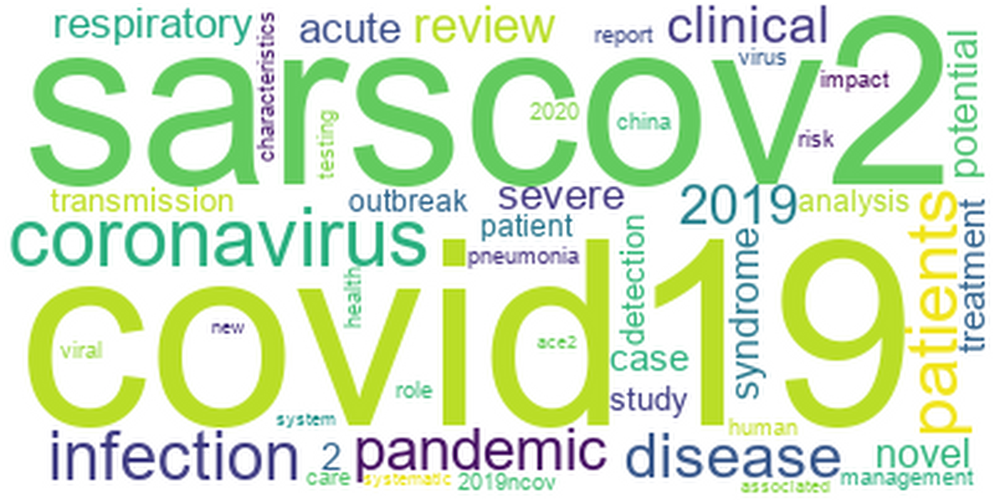

In [210]:
from wordcloud import WordCloud 
import matplotlib.pyplot as plt
import matplotlib


word_dict = dict(frequencies)

final = {key : value for key, value in word_dict.items() if value >= 200 }

wordcloud = WordCloud(font_path = 'Font/arial.ttf', background_color='white').generate_from_frequencies(final)

plt.figure(figsize=(40,30))
plt.imshow(wordcloud, interpolation='lanczos')
plt.axis('off')
plt.show()



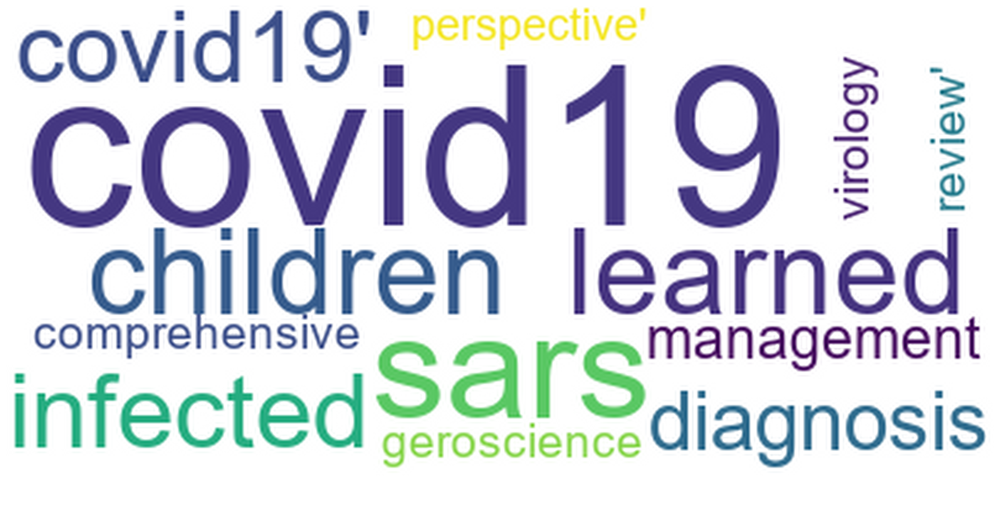

<Figure size 432x288 with 0 Axes>

In [262]:
from nltk.util import ngrams

text = list()
for title in tqdm(titles[1:4]):
    cleaned = re.sub('[-=+,#/\?:^$.@*\"\'\※~&%ㆍ!』\\‘|\(\)\[\]\<\>`\…》]', '', title)
    cleaned2 = cleaned.lower()
    token = nltk.work_tokenize(cleaned2)
    bitocken = list()
    for w in token:
        if w not in stops:
            bitoken.append(w)
 
wordcloud = WordCloud(font_path='font/arial.ttf', stopwords = STOPWORDS, background_color='white', collocation_threshold=30).generate(str(text))

plt.figure(figsize=(22,22)) #이미지 사이즈 지정
plt.imshow(wordcloud, interpolation='lanczos') #이미지의 부드럽기 정도
plt.axis('off') #x y 축 숫자 제거
plt.show() 
plt.savefig('wordcloud')


# Make a binomial word pair for network analysis through Gephi 

In [348]:
import nltk
from nltk.corpus import stopwords
# nltk.download('stopwords')
import csv
import re
from tqdm.notebook import tqdm


word_network = []
stops = set(stopwords.words('english'))
for title in titles[1:]:
    cleaned = re.sub('[-=+,#/\?:^$.@*\"※~&%ㆍ!』\\‘|\(\)\[\]\<\>`\'…》]', '', title)
    cleaned2 = cleaned.lower()
    token = nltk.word_tokenize(str(cleaned2))

    result = []
    for w in token:
        if w not in stops:
            result.append(w)
    biset = list(nltk.bigrams(result))
    word_network.append(biset)              
               
        
word_network[0:5]

[[('sars', 'covid19'),
  ('covid19', 'learned'),
  ('learned', 'children'),
  ('children', 'infected'),
  ('infected', 'covid19')],
 [('covid19', 'diagnosis'),
  ('diagnosis', 'management'),
  ('management', 'comprehensive'),
  ('comprehensive', 'review')],
 [('covid19', 'virology'),
  ('virology', 'geroscience'),
  ('geroscience', 'perspective')],
 [('current', 'status'),
  ('status', 'epidemiology'),
  ('epidemiology', 'diagnosis'),
  ('diagnosis', 'therapeutics'),
  ('therapeutics', 'vaccines'),
  ('vaccines', 'novel'),
  ('novel', 'coronavirus'),
  ('coronavirus', 'disease'),
  ('disease', '2019'),
  ('2019', 'covid19')],
 [('comprehensive', 'review'),
  ('review', 'covid19'),
  ('covid19', 'characteristics')]]

In [363]:
import pandas as pd
import itertools

#리스트 내 리스트 분리
def chain(*iterables):
    for it in iterables:
        for element in it:
            yield element
            
file = itertools.chain(*word_network)
df = pd.Series(file)
df

0                (sars, covid19)
1             (covid19, learned)
2            (learned, children)
3           (children, infected)
4            (infected, covid19)
                  ...           
79301          (covid19, health)
79302    (health, professionals)
79303    (professionals, report)
79304              (report, two)
79305               (two, cases)
Length: 79306, dtype: object

In [10]:
df.to_csv('final.csv', encoding = 'utf-8-sig')

# Result of Gephi

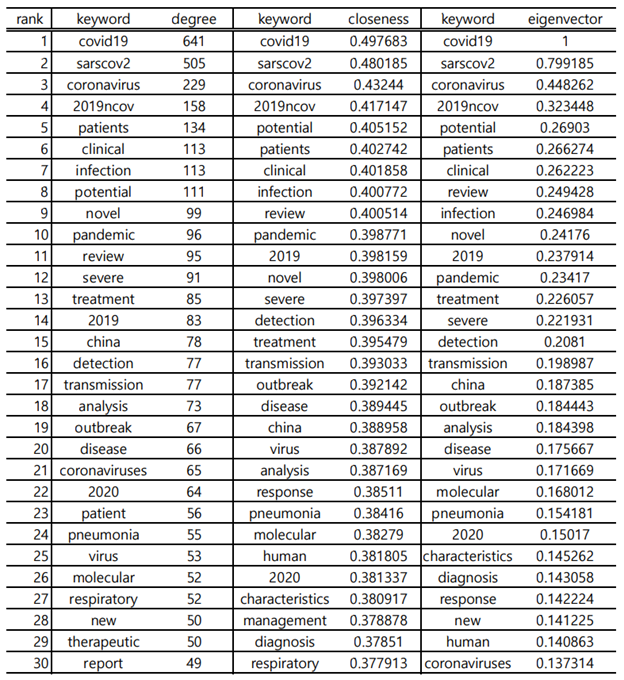

In [5]:
#!pip install IPython 
from IPython.display import Image
Image("word network.png")

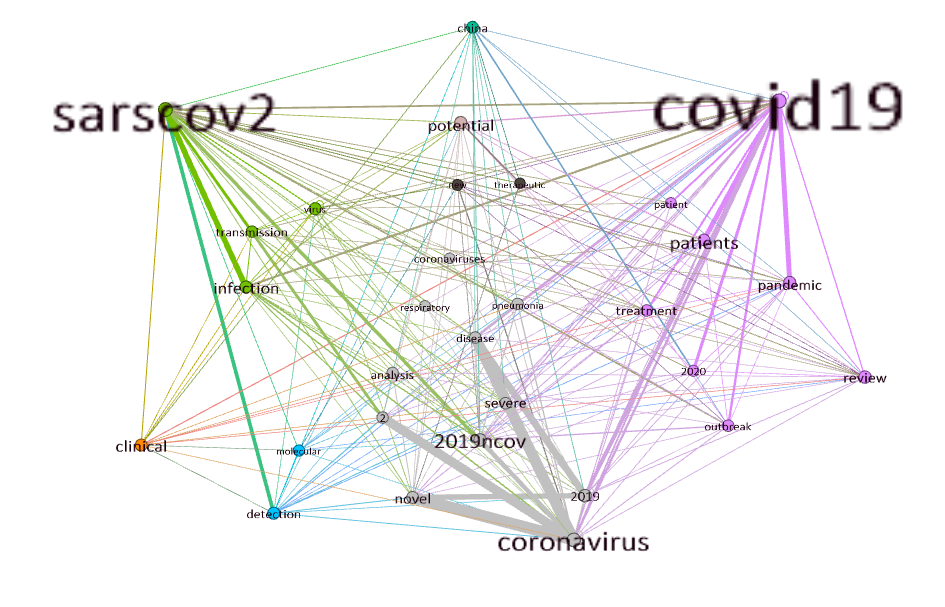

In [6]:
Image("word network1.png")

# Other way - Associate rule analysis

In [212]:
import nltk
from nltk.corpus import stopwords
# nltk.download('stopwords')
import csv
import re
from tqdm.notebook import tqdm


title_word = []
stops = set(stopwords.words('english'))
stopwords.words('english').append('2')

for title in titles[1:]:
    cleaned = re.sub('[-=+,#/\?:^$.@*\"※~&%ㆍ!』\\‘|\(\)\[\]\<\>`\'…》]', '', title)
    cleaned2 = cleaned.lower()
    token = nltk.word_tokenize(str(cleaned2))

    result = []
    for t in token:
        if t not in stops:
            result.append(t)
    title_word.append(result)

print(title_word[0:10])

[['sars', 'covid19', 'learned', 'children', 'infected', 'covid19'], ['covid19', 'diagnosis', 'management', 'comprehensive', 'review'], ['covid19', 'virology', 'geroscience', 'perspective'], ['current', 'status', 'epidemiology', 'diagnosis', 'therapeutics', 'vaccines', 'novel', 'coronavirus', 'disease', '2019', 'covid19'], ['comprehensive', 'review', 'covid19', 'characteristics'], ['covid19', 'novel', 'coronavirus', '2019', 'recent', 'trends'], ['perspectives', 'monoclonal', 'antibody', 'therapy', 'potential', 'therapeutic', 'intervention', 'coronavirus', 'disease19', 'covid19'], ['sarscov2', 'covid19', 'disease', 'mini', 'review', 'diagnostic', 'methods'], ['coronavirus', 'disease', '2019', 'covid19', 'current', 'status', 'future', 'perspectives'], ['emergency', 'surgery', 'covid19', 'pandemic', 'need', 'know', 'practice']]


http://blog.daum.net/geoscience/1408
https://towardsdatascience.com/association-rules-2-aa9a77241654

In [364]:
# !pip install apyori
from apyori import apriori
import pandas as pd
import plotly.graph_objects as go
import plotly.offline as pyo
pyo.init_notebook_mode()

word_network = (list(apriori(title_word, min_support=0.01)))
df=pd.DataFrame(word_network)
df['length']=df['items'].apply(lambda x: len(x))
df.head()

,items,support,ordered_statistics,length
0,(2),0.0420,"[((), (2), 0.042, 1.0)]",1
1,(2019),0.0716,"[((), (2019), 0.0716, 1.0)]",1
2,(2019ncov),0.0257,"[((), (2019ncov), 0.0257, 1.0)]",1
3,(2020),0.0225,"[((), (2020), 0.0225, 1.0)]",1
4,(ace2),0.0194,"[((), (ace2), 0.0194, 1.0)]",1


In [288]:
# !pip install apyori
from apyori import apriori
import pandas as pd
import plotly.graph_objects as go
import plotly.offline as pyo
pyo.init_notebook_mode()

word_network = (list(apriori(title_word, min_support=0.01)))
df=pd.DataFrame(word_network)
df['length']=df['items'].apply(lambda x: len(x))
df1 = df[(df['length']==1) &(df['support'] >=0.025)].sort_values(by='support', ascending =False)
df2 = df[(df['length']==2) &(df['support'] >=0.01)].sort_values(by='support', ascending =False)


word = df1['items'].tolist()
items = []
for w in word:
    cleaned_w = str(w).replace("frozenset({'","").replace("'})","")
    items.append(cleaned_w)

support = df1['support'].to_list()

freq_df = pd.DataFrame({'items':items, 'support':support})
fig = go.Figure()
fig.add_trace(go.Bar(x=freq_df['items'], y=freq_df['support'], name='term frequency'))
fig.show()

In [274]:
print(df2['items'][175])

frozenset({'covid19', 'pneumonia'})


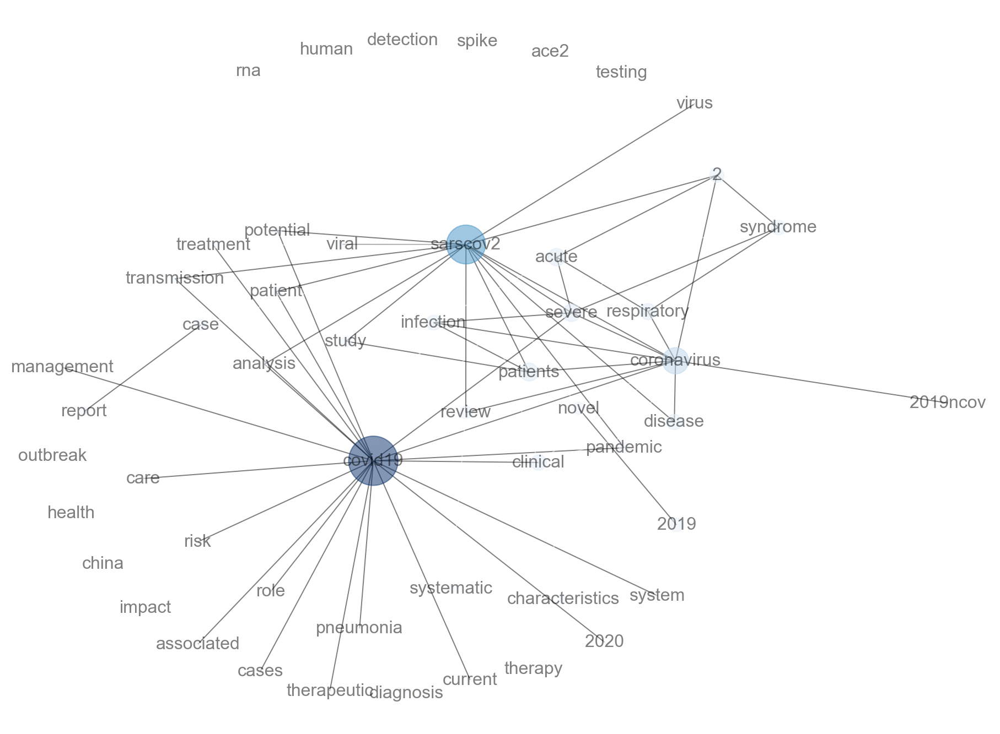

In [339]:
import networkx as nx
import numpy as np

G = nx.Graph()
ar = (df2['items']); G.add_edges_from(ar)

#노드 순위 지정 위해 페이지랭크 계산
pr=nx.pagerank(G)
nsize = np.array([v for v in pr.values()])
nsize = 2000 * (nsize - min(nsize)) / (max(nsize) - min(nsize))
               
pos = nx.kamada_kawai_layout(G)
                  
plt.figure(figsize=(16,12)); plt.axis('off')
nx.draw_networkx(G, font_family='arial', font_size=16,
                 pos=pos, node_color=list(pr.values()),node_size=nsize,
                 alpha=0.5, edge_color='10', cmap=plt.cm.Blues)
plt.show()